In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import json
import cv2



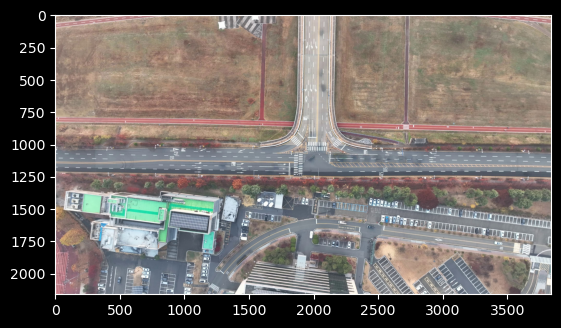

In [15]:
img_path = '../data/media/SiteA.jpg'
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

In [14]:
df = pd.read_csv('../data/drift/site_A/drone_1.csv')

df[1000:1010]

,track_id,frame,center_x,center_y,width,height,angle,x1,y1,x2,...,y3,x4,y4,confidence,class_id,site,lane,preceding_id,following_id,timestamp
1000,322.0,360,1697.665649,1159.821777,52.957462,21.887980,0.008733,1724.047729,1170.996582,1724.238892,...,1148.646973,1671.092407,1170.534180,0.942441,1.0,Site A,B5,319.0,325.0,07:35:29.115
1001,322.0,361,1697.698608,1159.810913,53.042767,21.917368,0.008604,1724.124756,1170.997314,1724.313232,...,1148.624512,1671.083984,1170.541016,0.942279,1.0,Site A,B5,319.0,325.0,07:35:29.149
1002,322.0,362,1697.757202,1159.789185,53.074730,21.918980,0.008724,1724.197998,1170.979858,1724.389160,...,1148.598511,1671.125244,1170.516724,0.942376,1.0,Site A,B5,319.0,325.0,07:35:29.181
1003,322.0,363,1697.740601,1159.748535,53.166149,21.944084,0.008677,1724.227417,1170.950928,1724.417847,...,1148.546143,1671.063354,1170.489502,0.942726,1.0,Site A,B5,319.0,325.0,07:35:29.215
1004,322.0,364,1697.731934,1159.740112,53.234013,21.963438,0.008671,1724.252686,1170.952271,1724.443115,...,1148.527954,1671.020752,1170.490601,0.942378,1.0,Site A,B5,319.0,325.0,07:35:29.248
1005,322.0,365,1697.724121,1159.745239,53.326168,22.001289,0.008650,1724.291016,1170.976074,1724.481445,...,1148.514404,1670.966797,1170.514893,0.942018,1.0,Site A,B5,319.0,325.0,07:35:29.281
1006,322.0,366,1697.703003,1159.784668,53.258350,21.963907,0.008611,1724.236572,1170.995483,1724.425781,...,1148.573853,1670.980225,1170.536987,0.941945,1.0,Site A,B5,319.0,325.0,07:35:29.314
1007,322.0,367,1697.740723,1159.783203,53.206863,21.937603,0.008468,1724.250366,1170.976807,1724.436157,...,1148.589600,1671.045288,1170.526367,0.941586,1.0,Site A,B5,319.0,325.0,07:35:29.348
1008,322.0,368,1697.744019,1159.799683,53.165100,21.915154,0.008379,1724.233887,1170.979614,1724.417480,...,1148.619751,1671.070557,1170.534058,0.941107,1.0,Site A,B5,319.0,325.0,07:35:29.382
1009,322.0,369,1697.672852,1159.827148,53.127533,21.901102,0.008214,1724.145752,1170.995483,1724.325684,...,1148.658813,1671.020020,1170.559204,0.940533,1.0,Site A,B5,319.0,325.0,07:35:29.415


In [12]:
df['timestamp'].min(), df['timestamp'].max()

('07:35:27.012', '07:39:06.231')

In [ ]:
m_per_px = 0.117


In [22]:
import pandas as pd
import glob
import os
import re

def stitch_drone_sessions(data_dir, gap_threshold_seconds=30):
    """
    Reads drone CSV files in numerical order, stitches them into sessions
    based on the time gap between the end of one file and start of the next.
    
    Parameters:
    - data_dir: Directory containing 'drone_*.csv' files.
    - gap_threshold_seconds: Max seconds allowed between files to be considered one session.
                             Default 30s (likely much smaller for split video files).
    
    Returns:
    - list of pandas DataFrames (one per flight session).
    """
    
    # 1. Find and sort files numerically
    pattern = os.path.join(data_dir, "drone_*.csv")
    files = glob.glob(pattern)
    
    def get_file_number(filepath):
        match = re.search(r'drone_(\d+)\.csv', filepath)
        return int(match.group(1)) if match else 0
        
    sorted_files = sorted(files, key=get_file_number)
    
    if not sorted_files:
        print("No drone files found.")
        return []
    
    print(f"Found {len(sorted_files)} files. Processing sessions...")

    sessions = []
    current_batch_dfs = []
    last_max_time = None
    
    # Helper to parse time string to datetime objects for comparison
    def get_time_range(df):
        # timestamps are 'HH:MM:SS.mmm'
        # We attach a dummy date to allow subtraction
        dt = pd.to_datetime(df['timestamp'], format='%H:%M:%S.%f')
        return dt.min(), dt.max()

    for i, filepath in enumerate(sorted_files):
        filename = os.path.basename(filepath)
        df = pd.read_csv(filepath)
        
        if df.empty:
            print(f"Skipping empty file: {filename}")
            continue
            
        current_min, current_max = get_time_range(df)
        
        # Decide whether to start a new session or stitch to current
        is_new_session = False
        
        if last_max_time is None:
            # First file of the first session
            is_new_session = False # It's the start of the current batch
        else:
            # Calculate gap from previous file end to current file start
            gap = (current_min - last_max_time).total_seconds()
            
            # Debug info
            # print(f"Gap between previous end and {filename}: {gap:.2f} seconds")
            
            # If gap is large (positive) or negative (timestamps reset?), start new session
            if gap > gap_threshold_seconds or gap < -5: 
                print(f"  -> Gap detected ({gap:.2f}s). Starting new session at {filename}.")
                is_new_session = True
            else:
                is_new_session = False

        if is_new_session and current_batch_dfs:
            # Stitch previous batch and add to results
            sessions.append(pd.concat(current_batch_dfs, ignore_index=True))
            current_batch_dfs = []
        
        current_batch_dfs.append(df)
        last_max_time = current_max

    # Append the final batch
    if current_batch_dfs:
        sessions.append(pd.concat(current_batch_dfs, ignore_index=True))

    print(f"\nTotal sessions created: {len(sessions)}")
    for i, s_df in enumerate(sessions):
        print(f"Session {i+1}: {len(s_df)} rows, Time: {s_df['timestamp'].min()} to {s_df['timestamp'].max()}")

    return sessions

data_dir = '../data/drift/site_A/'
sessions = stitch_drone_sessions(data_dir)

Found 18 files. Processing sessions...
  -> Gap detected (104.04s). Starting new session at drone_4.csv.
  -> Gap detected (1231.03s). Starting new session at drone_6.csv.
  -> Gap detected (80.05s). Starting new session at drone_10.csv.
  -> Gap detected (1338.06s). Starting new session at drone_13.csv.

Total sessions created: 5
Session 1: 571213 rows, Time: 07:35:27.012 to 07:45:50.969
Session 2: 333007 rows, Time: 07:47:35.006 to 07:51:14.993
Session 3: 1075304 rows, Time: 08:11:46.026 to 08:24:26.986
Session 4: 699357 rows, Time: 08:25:47.033 to 08:33:36.969
Session 5: 1415837 rows, Time: 08:55:55.025 to 09:14:25.968


In [17]:
def visualize_traffic_density(df, image_path, bins=None, alpha=0.6, cmap='jet'):
    """
    Creates and displays a heatmap of car density overlaid on the site image.
    
    Parameters:
    - df: DataFrame containing 'center_x' and 'center_y' columns.
    - image_path: Path to the background image (SiteA.jpg).
    - bins: Tuple (ny, nx) for histogram bins. If None, uses image dimensions (can be slow for 4K).
            Recommended: (1080, 1920) or similar aspect ratio for performance.
    - alpha: Transparency of the heatmap overlay (0 to 1).
    - cmap: Colormap scheme (e.g., 'jet', 'hot', 'viridis').
    """
    
    # 1. Load the image
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not load image from {image_path}")
    
    # Convert BGR to RGB for matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_h, img_w = img_rgb.shape[:2]
    
    # 2. Process Data
    # Filter out points that might be outside the image boundaries
    valid_points = df[
        (df['center_x'] >= 0) & (df['center_x'] < img_w) & 
        (df['center_y'] >= 0) & (df['center_y'] < img_h)
    ]
    
    x = valid_points['center_x'].values
    y = valid_points['center_y'].values
    
    # Define bins if not provided (defaulting to image size can be memory intensive for 4K)
    # Using a slightly lower resolution for the heatmap calculation makes it smoother and faster
    if bins is None:
        bins = (img_h // 4, img_w // 4) 
        
    # 3. Create 2D Histogram (Heatmap)
    heatmap, yedges, xedges = np.histogram2d(y, x, bins=bins, range=[[0, img_h], [0, img_w]])
    
    # 4. Smooth the heatmap
    # Gaussian blur spreads the points out to look like a continuous density field
    heatmap = cv2.GaussianBlur(heatmap, (0, 0), sigmaX=5, sigmaY=5)
    
    # Normalize heatmap to 0-255 for visualization
    if heatmap.max() > 0:
        heatmap_norm = (heatmap / heatmap.max() * 255).astype(np.uint8)
    else:
        heatmap_norm = heatmap.astype(np.uint8)
    
    # 5. Resize heatmap to match original image size
    heatmap_resized = cv2.resize(heatmap_norm, (img_w, img_h), interpolation=cv2.INTER_CUBIC)
    
    # 6. Apply Color Map
    # OpenCV colormaps are BGR, so we need to convert to RGB after
    colormap_map = getattr(cv2, f"COLORMAP_{cmap.upper()}")
    heatmap_color = cv2.applyColorMap(heatmap_resized, colormap_map)
    heatmap_color_rgb = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)
    
    # 7. Blend Image and Heatmap
    # We only want to color the areas where there is traffic density
    # Create a mask where density is low to keep original image clean in empty areas
    mask = heatmap_resized > 5  # Threshold to treat as "transparent"
    
    overlay = img_rgb.copy()
    
    # Blend only in masked areas
    overlay[mask] = cv2.addWeighted(img_rgb[mask], 1 - alpha, heatmap_color_rgb[mask], alpha, 0)
    
    # 8. Plot
    plt.figure(figsize=(15, 10))
    plt.imshow(overlay)
    plt.axis('off')
    plt.title(f'Traffic Density Heatmap (N={len(df)} frames)')
    plt.tight_layout()
    plt.show()

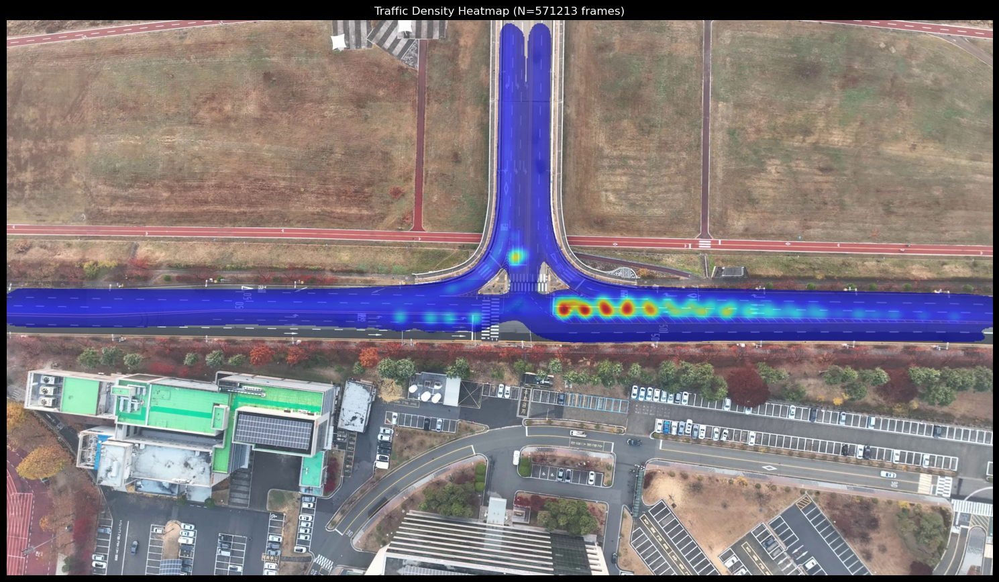

In [23]:
visualize_traffic_density(sessions[0], img_path)

In [24]:
sessions[0]["lane"].unique()

array(['B5', 'crossroads1', 'A4', 'A5', 'B2', 'B3', 'A3', 'C4', 'C5',
       'B4', 'B1', 'A2', 'A6', 'A1', 'C3', 'C2', 'C1', 'B7', 'B6'],
      dtype=object)

Processing 5 sessions...
AGGREGATED TRAFFIC STATS (Total Duration: 3185.78s)
Lane       | Side       | Total Count  | Freq (cars/s)  
------------------------------------------------------------
Lane 1     | Left       | 366          | 0.1149
Lane 2     | Left       | 167          | 0.0524
Lane 3     | Top        | 478          | 0.1500
Lane 4     | Top        | 237          | 0.0744
Lane 5     | Top        | 115          | 0.0361
Lane 6     | Right      | 347          | 0.1089
Lane 7     | Right      | 409          | 0.1284
Lane 8     | Right      | 475          | 0.1491


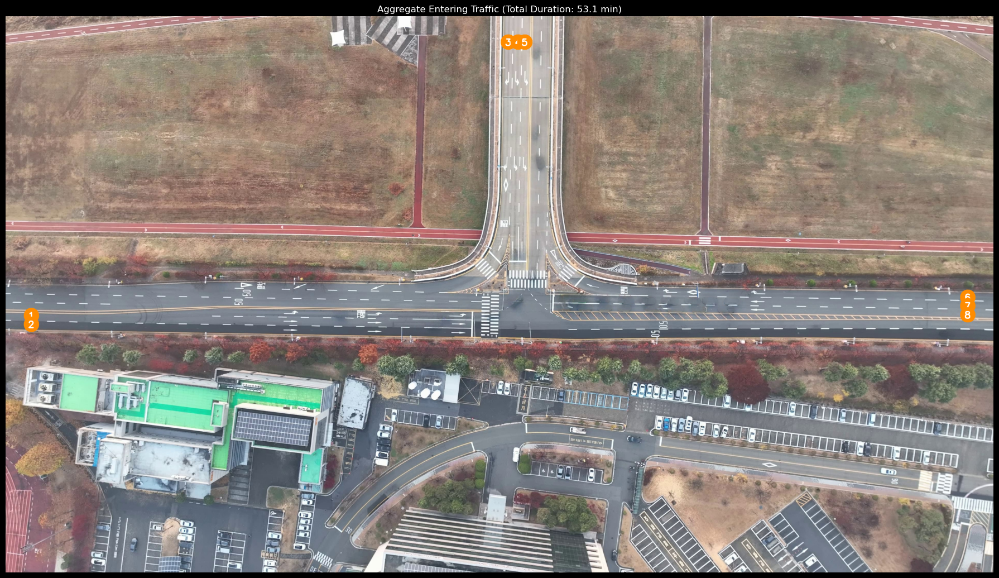

In [32]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

def visualize_entering_stats_multi(df_list, image_path, margin=200):
    """
    Aggregates statistics from multiple sessions (list of DataFrames)
    and visualizes 8 entering lanes with combined stats.
    
    Parameters:
    - df_list: List of DataFrames, each representing a session.
    - image_path: Path to background image.
    - margin: Pixel distance from edge to define 'entering'.
    """
    
    # 1. Load Image
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError("Image not found.")
    img_h, img_w = img.shape[:2]
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Initialize containers for aggregation
    all_starts = []
    total_duration = 0.0
    
    print(f"Processing {len(df_list)} sessions...")
    
    # 2. Aggregate Data Loop
    for i, df in enumerate(df_list):
        if df.empty: continue
            
        # Calculate session duration
        times = pd.to_datetime(df['timestamp'], format='%H:%M:%S.%f')
        duration = (times.max() - times.min()).total_seconds()
        
        # Handle single-frame or zero duration
        if duration <= 0: duration = 0.1 
        
        total_duration += duration
        
        # Get starts for this session
        df_sorted = df.sort_values('timestamp')
        starts = df_sorted.groupby('track_id').first().reset_index()
        all_starts.append(starts)
        
    if not all_starts:
        print("No valid data found.")
        return

    # Combine all start points into one DataFrame
    combined_starts = pd.concat(all_starts, ignore_index=True)
    
    print(f"{'='*55}")
    print(f"AGGREGATED TRAFFIC STATS (Total Duration: {total_duration:.2f}s)")
    print(f"{'='*55}")
    print(f"{'Lane':<10} | {'Side':<10} | {'Total Count':<12} | {'Freq (cars/s)':<15}")
    print(f"{'-'*60}")
    
    # 3. Filter Entries by Side (using combined data)
    left_entries = combined_starts[combined_starts['center_x'] < margin].copy()
    top_entries = combined_starts[combined_starts['center_y'] < margin].copy()
    right_entries = combined_starts[combined_starts['center_x'] > (img_w - margin)].copy()
    
    lane_counter = 1

    # 4. Helper Function (Same logic, applied to combined data)
    def process_side(entries, n_lanes, coordinate_col, side_name, start_lane_id):
        nonlocal lane_counter
        
        if len(entries) < n_lanes:
            print(f"Not enough data for {side_name} to find {n_lanes} lanes.")
            return start_lane_id + n_lanes # Skip ID increment even if failed to keep consistent? 
            # Or better, just print 0s. Let's try to proceed if we have at least 1 point, else skip.
            if len(entries) == 0:
                return start_lane_id + n_lanes

        # Cluster
        coords = entries[coordinate_col].values.reshape(-1, 1)
        
        # Robust check: if fewer points than clusters, reduce clusters
        actual_clusters = min(n_lanes, len(entries))
        
        kmeans = KMeans(n_clusters=actual_clusters, random_state=42, n_init=10)
        kmeans.fit(coords)
        
        centers = kmeans.cluster_centers_.flatten()
        labels = kmeans.labels_
        
        # Sort by coordinate
        sorted_indices = np.argsort(centers)
        
        for i in range(actual_clusters):
            cluster_idx = sorted_indices[i]
            center_val = centers[cluster_idx]
            count = np.sum(labels == cluster_idx)
            freq = count / total_duration
            
            current_lane_id = start_lane_id + i
            
            print(f"Lane {current_lane_id:<5} | {side_name:<10} | {count:<12} | {freq:.4f}")
            
            # Visualization
            if side_name == 'Left':
                pos = (int(margin/2), int(center_val))
            elif side_name == 'Right':
                pos = (int(img_w - margin/2), int(center_val))
            elif side_name == 'Top':
                pos = (int(center_val), int(margin/2))
                
            # Draw Marker
            cv2.circle(img_rgb, pos, 30, (255, 140, 0), -1) 
            
            # Draw Text
            text = str(current_lane_id)
            font = cv2.FONT_HERSHEY_SIMPLEX
            font_scale = 1.2
            thickness = 3
            text_size = cv2.getTextSize(text, font, font_scale, thickness)[0]
            text_x = pos[0] - text_size[0] // 2
            text_y = pos[1] + text_size[1] // 2
            
            cv2.putText(img_rgb, text, (text_x, text_y), font, font_scale, (255, 255, 255), thickness)
            
        return start_lane_id + n_lanes

    # 5. Process Sides
    next_id = process_side(left_entries, 2, 'center_y', 'Left', 1)
    next_id = process_side(top_entries, 3, 'center_x', 'Top', next_id)
    process_side(right_entries, 3, 'center_y', 'Right', next_id)
    
    print(f"{'='*60}")
    
    # 6. Display
    plt.figure(figsize=(18, 12))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title(f'Aggregate Entering Traffic (Total Duration: {total_duration/60:.1f} min)')
    plt.tight_layout()
    plt.show()

# Example Usage:
visualize_entering_stats_multi(sessions, img_path)

Calculating speeds across sessions...
Computed speeds for 4090738 points. Avg Speed: 7.76 m/s


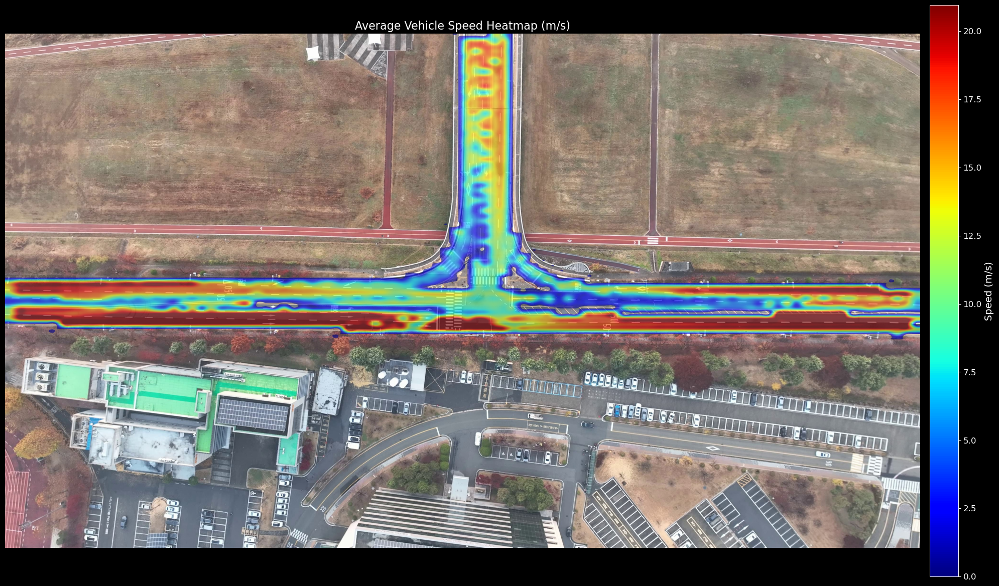

In [35]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib import cm

def visualize_speed_heatmap(df_list, image_path, m_per_px=0.117, bins=(100, 100), alpha=0.6, cmap='jet'):
    """
    Creates a heatmap of average vehicle speeds overlaid on the site image.
    Fixed to handle indexing correctly during speed calculation.
    """
    
    # 1. Load Image
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError("Image not found.")
    img_h, img_w = img.shape[:2]
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    all_speeds = []
    all_x = []
    all_y = []
    
    print("Calculating speeds across sessions...")
    
    # 2. Process Data to Calculate Speeds
    for df in df_list:
        if df.empty: continue
            
        # Work on a copy to avoid SettingWithCopy warnings on the original df
        df_calc = df.sort_values(['track_id', 'timestamp']).copy()
        
        # Convert timestamp to datetime once
        df_calc['datetime'] = pd.to_datetime(df_calc['timestamp'], format='%H:%M:%S.%f')
        
        # Group by track_id
        grouped = df_calc.groupby('track_id')
        
        # Calculate shifts directly into new columns in the DataFrame to preserve index alignment
        # We use transform to keep the same shape/index as original df_calc
        df_calc['prev_x'] = grouped['center_x'].shift(1)
        df_calc['prev_y'] = grouped['center_y'].shift(1)
        df_calc['prev_time'] = grouped['datetime'].shift(1)
        
        # Now calculate deltas row-wise
        dx = df_calc['center_x'] - df_calc['prev_x']
        dy = df_calc['center_y'] - df_calc['prev_y']
        dt = (df_calc['datetime'] - df_calc['prev_time']).dt.total_seconds()
        
        # Distance in pixels
        dist_px = np.sqrt(dx**2 + dy**2)
        
        # Create mask for valid rows (not the first frame of a track, and reasonable dt)
        # dt can be NaN for the first frame, so dt > 0 handles that.
        valid_mask = (dt > 0.01) & (dt < 1.0)
        
        # Calculate speed for valid rows
        # We can simply filter the series now because they all share the df_calc index
        current_speeds = (dist_px[valid_mask] * m_per_px) / dt[valid_mask]
        
        current_xs = df_calc.loc[valid_mask, 'center_x']
        current_ys = df_calc.loc[valid_mask, 'center_y']
        
        # Filter outliers
        mask_clean = current_speeds < 40 # m/s
        
        if mask_clean.any():
            all_speeds.append(current_speeds[mask_clean].values)
            all_x.append(current_xs[mask_clean].values)
            all_y.append(current_ys[mask_clean].values)

    if not all_speeds:
        print("No valid speed data found.")
        return

    # Flatten lists
    all_speeds = np.concatenate(all_speeds)
    all_x = np.concatenate(all_x)
    all_y = np.concatenate(all_y)
    
    print(f"Computed speeds for {len(all_speeds)} points. Avg Speed: {np.mean(all_speeds):.2f} m/s")

    # 3. Create 2D Grid for Average Speed
    x_edges = np.linspace(0, img_w, bins[1] + 1)
    y_edges = np.linspace(0, img_h, bins[0] + 1)
    
    bin_x = np.digitize(all_x, x_edges) - 1
    bin_y = np.digitize(all_y, y_edges) - 1
    
    valid_bins = (bin_x >= 0) & (bin_x < bins[1]) & (bin_y >= 0) & (bin_y < bins[0])
    
    bin_x = bin_x[valid_bins]
    bin_y = bin_y[valid_bins]
    speeds = all_speeds[valid_bins]
    
    speed_sum = np.zeros(bins)
    count_grid = np.zeros(bins)
    
    flat_indices = bin_y * bins[1] + bin_x
    
    np.add.at(speed_sum.ravel(), flat_indices, speeds)
    np.add.at(count_grid.ravel(), flat_indices, 1)
    
    with np.errstate(divide='ignore', invalid='ignore'):
        mean_speed_grid = speed_sum / count_grid
        mean_speed_grid[count_grid == 0] = 0
        
    # 4. Process Heatmap for Display
    heatmap_full = cv2.resize(mean_speed_grid, (img_w, img_h), interpolation=cv2.INTER_CUBIC)
    
    # Mask empty areas
    mask = heatmap_full > 0.1
    
    vmax = np.percentile(all_speeds, 95)
    vmin = 0
    
    norm_heatmap = (heatmap_full - vmin) / (vmax - vmin)
    norm_heatmap = np.clip(norm_heatmap, 0, 1)
    
    cmap_obj = plt.get_cmap(cmap)
    colored_heatmap = cmap_obj(norm_heatmap)
    colored_heatmap = (colored_heatmap[:, :, :3] * 255).astype(np.uint8)
    
    # 5. Overlay
    overlay = img_rgb.copy()
    overlay[mask] = cv2.addWeighted(img_rgb[mask], 1 - alpha, colored_heatmap[mask], alpha, 0)
    
    # 6. Plot
    plt.figure(figsize=(20, 12))
    # Capture the axes object returned by imshow or use gca()
    ax = plt.gca() 
    img_plot = ax.imshow(overlay)
    ax.axis('off')
    ax.set_title(f'Average Vehicle Speed Heatmap (m/s)', fontsize=16)
    
    # Create the scalar mappable
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm.set_array([])
    
    # Explicitly pass the axes 'ax' to steal space from
    cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.01)
    
    cbar.set_label('Speed (m/s)', fontsize=14)
    cbar.ax.tick_params(labelsize=12)
    
    plt.tight_layout()
    plt.show()

# Example Usage:
visualize_speed_heatmap(sessions, img_path)

Analyzing continuous deceleration phases...
Analyzed 798356 data points of braking.
Average Deceleration: 2.85 m/s²
Median Deceleration: 2.67 m/s²
95th Percentile (Hard Braking): 5.54 m/s²


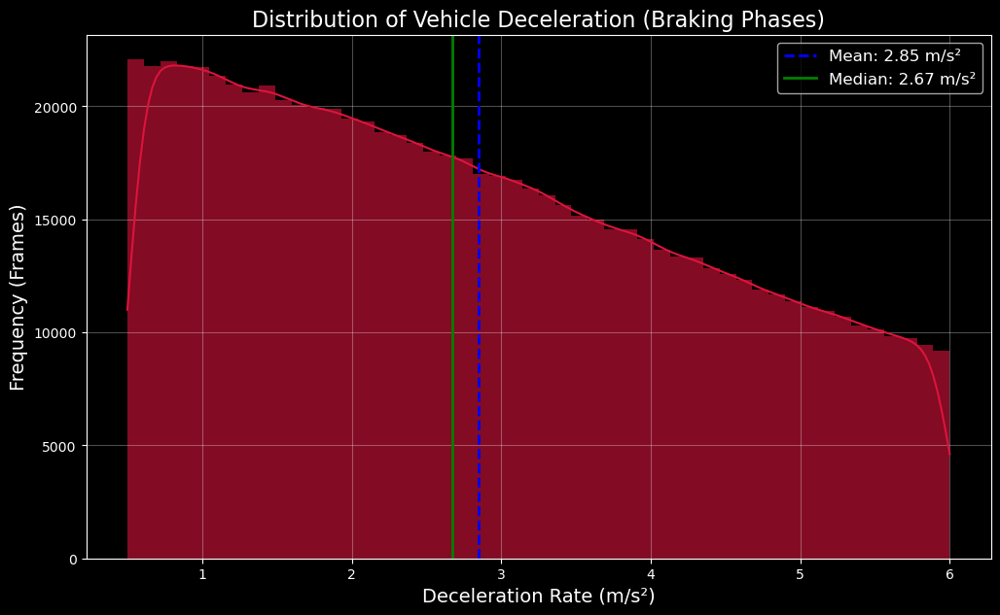

In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def analyze_stopping_deceleration_v2(df_list, m_per_px=0.117):
    """
    Calculates deceleration statistics by analyzing all significant braking phases.
    Improved to be more robust than just looking for full stops.
    
    Parameters:
    - df_list: List of DataFrames (sessions).
    - m_per_px: Meters per pixel ratio.
    """
    
    all_decelerations = []
    
    print("Analyzing continuous deceleration phases...")
    
    for df in df_list:
        if df.empty: continue
        
        # 1. Calculate Speed & Acceleration for entire dataframe
        df_calc = df.sort_values(['track_id', 'timestamp']).copy()
        df_calc['datetime'] = pd.to_datetime(df_calc['timestamp'], format='%H:%M:%S.%f')
        
        grouped = df_calc.groupby('track_id')
        
        # Calculate shifts
        df_calc['prev_x'] = grouped['center_x'].shift(1)
        df_calc['prev_y'] = grouped['center_y'].shift(1)
        df_calc['prev_time'] = grouped['datetime'].shift(1)
        
        dx = df_calc['center_x'] - df_calc['prev_x']
        dy = df_calc['center_y'] - df_calc['prev_y']
        dt = (df_calc['datetime'] - df_calc['prev_time']).dt.total_seconds()
        
        # Speed (m/s)
        dist_px = np.sqrt(dx**2 + dy**2)
        valid_mask = (dt > 0.01) & (dt < 1.0)
        
        df_calc['speed'] = np.nan
        df_calc.loc[valid_mask, 'speed'] = (dist_px[valid_mask] * m_per_px) / dt[valid_mask]
        
        # Smooth speed (Rolling window of ~1s)
        # This is critical to reduce noise in derivative (acceleration)
        df_calc['speed_smooth'] = grouped['speed'].transform(lambda x: x.rolling(window=10, min_periods=3).mean())
        
        # Calculate Acceleration (m/s^2)
        # a = (v2 - v1) / dt
        df_calc['prev_speed'] = grouped['speed_smooth'].shift(1)
        df_calc['accel'] = (df_calc['speed_smooth'] - df_calc['prev_speed']) / dt
        
        # 2. Extract Significant Deceleration Events
        # We look for rows where acceleration is negative (braking)
        # We filter for:
        # - Deceleration magnitude > 0.5 m/s^2 (ignore coasting/noise)
        # - Speed > 2 m/s (ignore creeping at stop line)
        # - Deceleration < 6 m/s^2 (ignore tracking glitches/impossible physics)
        
        braking_mask = (df_calc['accel'] < -0.5) & \
                       (df_calc['accel'] > -6.0) & \
                       (df_calc['speed_smooth'] > 2.0)
        
        valid_decel = -df_calc.loc[braking_mask, 'accel'].values # Flip sign to positive
        
        all_decelerations.extend(valid_decel)

    if not all_decelerations:
        print("No significant deceleration detected.")
        return

    # 3. Plot Distribution
    all_decelerations = np.array(all_decelerations)
    
    avg_decel = np.mean(all_decelerations)
    median_decel = np.median(all_decelerations)
    p95_decel = np.percentile(all_decelerations, 95)
    
    print(f"Analyzed {len(all_decelerations)} data points of braking.")
    print(f"Average Deceleration: {avg_decel:.2f} m/s²")
    print(f"Median Deceleration: {median_decel:.2f} m/s²")
    print(f"95th Percentile (Hard Braking): {p95_decel:.2f} m/s²")
    
    plt.figure(figsize=(12, 7))
    sns.histplot(all_decelerations, kde=True, bins=50, color='crimson', edgecolor=None, alpha=0.6)
    
    plt.axvline(avg_decel, color='blue', linestyle='--', linewidth=2, label=f'Mean: {avg_decel:.2f} m/s²')
    plt.axvline(median_decel, color='green', linestyle='-', linewidth=2, label=f'Median: {median_decel:.2f} m/s²')
    
    plt.title('Distribution of Vehicle Deceleration (Braking Phases)', fontsize=16)
    plt.xlabel('Deceleration Rate (m/s²)', fontsize=14)
    plt.ylabel('Frequency (Frames)', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.show()

# Example Usage:
analyze_stopping_deceleration_v2(sessions)

Analyzing continuous acceleration phases...
Analyzed 830667 data points of acceleration.
Average Acceleration: 2.49 m/s²
Median Acceleration: 2.36 m/s²
95th Percentile: 4.66 m/s²


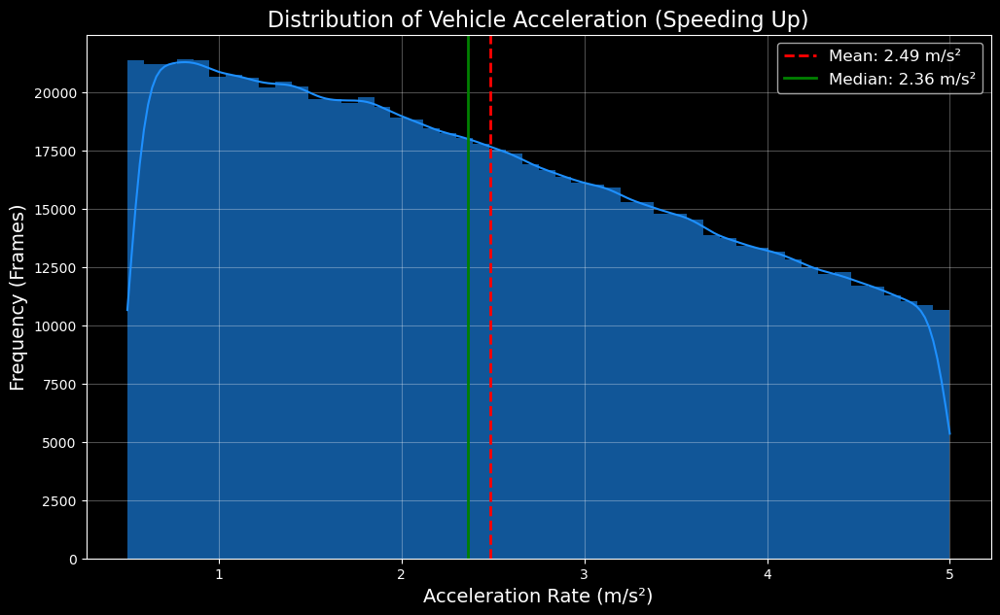

In [38]:
def analyze_acceleration_phases(df_list, m_per_px=0.117):
    """
    Calculates statistics for positive acceleration phases (speeding up).
    
    Parameters:
    - df_list: List of DataFrames (sessions).
    - m_per_px: Meters per pixel ratio.
    """
    
    all_accelerations = []
    
    print("Analyzing continuous acceleration phases...")
    
    for df in df_list:
        if df.empty: continue
        
        # 1. Calculate Speed & Acceleration
        df_calc = df.sort_values(['track_id', 'timestamp']).copy()
        df_calc['datetime'] = pd.to_datetime(df_calc['timestamp'], format='%H:%M:%S.%f')
        
        grouped = df_calc.groupby('track_id')
        
        # Shifts
        df_calc['prev_x'] = grouped['center_x'].shift(1)
        df_calc['prev_y'] = grouped['center_y'].shift(1)
        df_calc['prev_time'] = grouped['datetime'].shift(1)
        
        dx = df_calc['center_x'] - df_calc['prev_x']
        dy = df_calc['center_y'] - df_calc['prev_y']
        dt = (df_calc['datetime'] - df_calc['prev_time']).dt.total_seconds()
        
        # Speed
        dist_px = np.sqrt(dx**2 + dy**2)
        valid_mask = (dt > 0.01) & (dt < 1.0)
        
        df_calc['speed'] = np.nan
        df_calc.loc[valid_mask, 'speed'] = (dist_px[valid_mask] * m_per_px) / dt[valid_mask]
        
        # Smooth Speed (1s window)
        df_calc['speed_smooth'] = grouped['speed'].transform(lambda x: x.rolling(window=10, min_periods=3).mean())
        
        # Acceleration
        df_calc['prev_speed'] = grouped['speed_smooth'].shift(1)
        df_calc['accel'] = (df_calc['speed_smooth'] - df_calc['prev_speed']) / dt
        
        # 2. Extract Acceleration Events
        # Filter for:
        # - Acceleration > 0.5 m/s^2 (ignore noise/coasting)
        # - Acceleration < 5.0 m/s^2 (ignore unrealistic spikes)
        # - Speed > 1.0 m/s (ignore jitter at standstill)
        
        accel_mask = (df_calc['accel'] > 0.5) & \
                     (df_calc['accel'] < 5.0) & \
                     (df_calc['speed_smooth'] > 1.0)
        
        valid_accel = df_calc.loc[accel_mask, 'accel'].values
        
        all_accelerations.extend(valid_accel)

    if not all_accelerations:
        print("No significant acceleration detected.")
        return

    # 3. Plot
    all_accelerations = np.array(all_accelerations)
    
    avg_accel = np.mean(all_accelerations)
    median_accel = np.median(all_accelerations)
    p95_accel = np.percentile(all_accelerations, 95)
    
    print(f"Analyzed {len(all_accelerations)} data points of acceleration.")
    print(f"Average Acceleration: {avg_accel:.2f} m/s²")
    print(f"Median Acceleration: {median_accel:.2f} m/s²")
    print(f"95th Percentile: {p95_accel:.2f} m/s²")
    
    plt.figure(figsize=(12, 7))
    sns.histplot(all_accelerations, kde=True, bins=50, color='dodgerblue', edgecolor=None, alpha=0.6)
    
    plt.axvline(avg_accel, color='red', linestyle='--', linewidth=2, label=f'Mean: {avg_accel:.2f} m/s²')
    plt.axvline(median_accel, color='green', linestyle='-', linewidth=2, label=f'Median: {median_accel:.2f} m/s²')
    
    plt.title('Distribution of Vehicle Acceleration (Speeding Up)', fontsize=16)
    plt.xlabel('Acceleration Rate (m/s²)', fontsize=14)
    plt.ylabel('Frequency (Frames)', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.show()

# Example Usage:
analyze_acceleration_phases(sessions)

Analyzing standstill distances...
Analyzed 17314 stopped pairs.
Avg Center-to-Center: 9.16 m (Median: 8.89 m)
Avg Bumper-to-Bumper: 2.86 m (Median: 2.63 m)


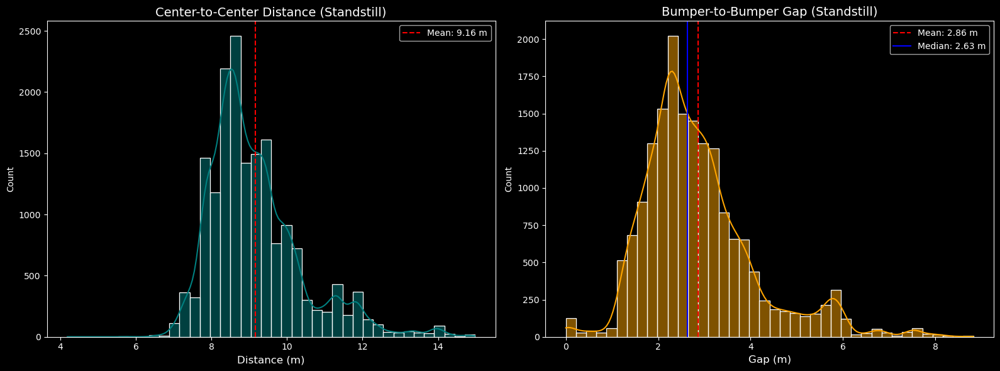

In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import cKDTree

def analyze_standstill_distances(df_list, m_per_px=0.117, stop_speed_threshold=0.5):
    """
    Calculates center-to-center and bumper-to-bumper distances for stopped cars.
    
    Parameters:
    - df_list: List of DataFrames (sessions).
    - m_per_px: Meters per pixel ratio.
    - stop_speed_threshold: Speed (m/s) below which a car is considered "still".
    """
    
    center_dists = [] # Headway
    bumper_dists = [] # Gap
    
    print("Analyzing standstill distances...")
    
    for df_idx, df in enumerate(df_list):
        if df.empty: continue
        
        # 1. Preprocess: Calculate speed for every frame
        # (Simplified speed calc for filtering)
        # We need to group by track to get proper deltas, but for efficiency in big loop,
        # we can just assume if we process frame by frame, we look at 'stationary' status.
        # Ideally, we should reuse the speed calculation logic from before.
        
        # Let's do a quick speed estimation on the whole DF
        df_calc = df.sort_values(['track_id', 'timestamp']).copy()
        df_calc['datetime'] = pd.to_datetime(df_calc['timestamp'], format='%H:%M:%S.%f')
        
        grouped = df_calc.groupby('track_id')
        dx = grouped['center_x'].diff()
        dy = grouped['center_y'].diff()
        dt = grouped['datetime'].diff().dt.total_seconds()
        
        dist_px = np.sqrt(dx**2 + dy**2)
        speed = (dist_px * m_per_px) / dt
        df_calc['speed'] = speed.fillna(0)
        
        # Filter for stopped cars
        stopped_df = df_calc[df_calc['speed'] < stop_speed_threshold].copy()
        
        if stopped_df.empty: continue
            
        # 2. Iterate by Timestamp (Frame)
        # We want to find distances between cars existing in the *same frame*
        # To avoid over-counting the same pair sitting at a red light for 100 frames,
        # we can sample frames (e.g., every 1 second) or just take unique pairs per stop event.
        # A simple robust way: Process every Nth frame (e.g. every 10th frame ~ 0.3s)
        
        timestamps = stopped_df['timestamp'].unique()
        # Sampling to speed up and reduce correlation
        timestamps = timestamps[::10] 
        
        for ts in timestamps:
            frame_cars = stopped_df[stopped_df['timestamp'] == ts]
            
            if len(frame_cars) < 2: continue
            
            # Extract coordinates and angles
            coords = frame_cars[['center_x', 'center_y']].values
            angles = frame_cars['angle'].values # Radians usually? Check dataset.
            # Assuming 'angle' is in radians. If degrees, convert. 
            # Drift dataset often uses radians.
            
            ids = frame_cars['track_id'].values
            widths = frame_cars['width'].values
            heights = frame_cars['height'].values # Length of car usually roughly along heading
            
            # Build KDTree for fast spatial lookup
            tree = cKDTree(coords)
            
            # For each car, find nearest neighbors
            # k=2 because nearest is itself
            dists, indices = tree.query(coords, k=2) 
            
            for i, (dist, idx_pair) in enumerate(zip(dists, indices)):
                neighbor_idx = idx_pair[1]
                
                # neighbor_idx might be out of bounds if k > points, but here k=2 and len >=2
                if neighbor_idx == len(frame_cars): continue 
                
                # Check if this neighbor is actually "in front"
                # We calculate the relative vector
                dx = coords[neighbor_idx][0] - coords[i][0]
                dy = coords[neighbor_idx][1] - coords[i][1]
                
                # Project onto car's heading vector
                # Heading vector (cos(angle), sin(angle))
                # Note: Check if angle is 0 at East or North. Assuming standard math (0=East, CCW).
                # If Drift uses different convention (e.g. 0=North, CW), adjustment needed.
                # Assuming standard for now.
                
                heading_x = np.cos(angles[i])
                heading_y = np.sin(angles[i])
                
                # Dot product to see if in front
                # dot > 0 means generally in front
                # We also want them to be roughly aligned (same lane)
                # Distance perpendicular to heading should be small (< lane width ~ 3.5m)
                
                longitudinal_dist = dx * heading_x + dy * heading_y
                lateral_dist = abs(-dx * heading_y + dy * heading_x) # Perpendicular
                
                lateral_dist_m = lateral_dist * m_per_px
                
                # Criteria for "following":
                # 1. In front (longitudinal > 0)
                # 2. In same lane (lateral < 2.0 meters roughly)
                # 3. Not too far (e.g. < 15 meters)
                if longitudinal_dist > 0 and lateral_dist_m < 2.5 and (longitudinal_dist * m_per_px) < 15.0:
                    
                    # Calculate Center-to-Center (Headway)
                    c2c_px = np.sqrt(dx**2 + dy**2)
                    c2c_m = c2c_px * m_per_px
                    
                    # Calculate Bumper-to-Bumper (Gap)
                    # Gap = CenterDist - (Length_Rear + Length_Front)/2
                    # Assuming 'height' in dataset corresponds to vehicle length (common in bounding boxes aligned with road)
                    # Or 'width' if rotated.
                    # Usually bounding box is (width, height) relative to image axis, OR rotated rect.
                    # The dataset has 'width', 'height' and 'angle'. 
                    # If it's a rotated rect, width/height are object dimensions.
                    # Let's assume height is length (longer dimension usually).
                    length_rear = max(widths[i], heights[i]) 
                    length_front = max(widths[neighbor_idx], heights[neighbor_idx])
                    
                    # Ideally, calculate actual projected length based on orientation,
                    # but approx: half length of rear + half length of front
                    gap_px = c2c_px - (length_rear/2 + length_front/2)
                    gap_m = gap_px * m_per_px
                    
                    # Filter physical impossibilities (crashes or bounding box overlaps)
                    if gap_m < -1.0: continue # Allow small overlap due to noise, but not huge
                    
                    gap_m = max(0.0, gap_m) # Clamp to 0
                    
                    center_dists.append(c2c_m)
                    bumper_dists.append(gap_m)

    if not center_dists:
        print("No stopped cars found following each other.")
        return

    # 3. Plot Distribution
    c2c = np.array(center_dists)
    b2b = np.array(bumper_dists)
    
    # Filter outliers for clean plots
    c2c = c2c[c2c < 20]
    b2b = b2b[b2b < 10]
    
    print(f"Analyzed {len(c2c)} stopped pairs.")
    print(f"Avg Center-to-Center: {np.mean(c2c):.2f} m (Median: {np.median(c2c):.2f} m)")
    print(f"Avg Bumper-to-Bumper: {np.mean(b2b):.2f} m (Median: {np.median(b2b):.2f} m)")
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Center-to-Center Plot
    sns.histplot(c2c, kde=True, bins=40, color='teal', ax=axes[0])
    axes[0].set_title('Center-to-Center Distance (Standstill)', fontsize=14)
    axes[0].set_xlabel('Distance (m)', fontsize=12)
    axes[0].axvline(np.mean(c2c), color='red', linestyle='--', label=f'Mean: {np.mean(c2c):.2f} m')
    axes[0].legend()
    
    # Bumper-to-Bumper Plot
    sns.histplot(b2b, kde=True, bins=40, color='orange', ax=axes[1])
    axes[1].set_title('Bumper-to-Bumper Gap (Standstill)', fontsize=14)
    axes[1].set_xlabel('Gap (m)', fontsize=12)
    axes[1].axvline(np.mean(b2b), color='red', linestyle='--', label=f'Mean: {np.mean(b2b):.2f} m')
    axes[1].axvline(np.median(b2b), color='blue', linestyle='-', label=f'Median: {np.median(b2b):.2f} m')
    axes[1].legend()
    
    plt.tight_layout()
    plt.show()

# Example Usage:
analyze_standstill_distances(sessions)

In [46]:
df = pd.read_csv('../data/drift/simulation.csv')
visualize_speed_heatmap([df], img_path)

# print(df)

Calculating speeds across sessions...


ValueError: time data "0" doesn't match format "%H:%M:%S.%f", at position 0. You might want to try:
    - passing `format` if your strings have a consistent format;
    - passing `format='ISO8601'` if your strings are all ISO8601 but not necessarily in exactly the same format;
    - passing `format='mixed'`, and the format will be inferred for each element individually. You might want to use `dayfirst` alongside this.

In [45]:
print(sessions[0])

        track_id  frame     center_x     center_y      width     height  \
0          319.0    297  1788.871338  1163.560913  53.738293  19.964605   
1          319.0    298  1788.923096  1163.572876  53.811653  19.981730   
2          319.0    299  1788.957031  1163.558960  53.936909  20.020344   
3          319.0    300  1789.144775  1163.543335  53.546047  19.868242   
4          319.0    301  1789.211670  1163.557129  53.434265  19.823317   
...          ...    ...          ...          ...        ...        ...   
571208    1484.0   5254  1466.429321  1121.560669  49.501621  19.519909   
571209    1484.0   5255  1461.408203  1121.115479  50.466599  19.915541   
571210    1484.0   5257  1454.164917  1121.415161  49.274654  19.495506   
571211    1484.0   5258  1447.731812  1121.245605  50.764011  20.085045   
571212    1484.0   5261  1435.773682  1121.126709  49.433163  19.531731   

           angle           x1           y1           x2  ...           y3  \
0       3.133297  1761

Loading simulation data from ../data/drift/simulation.csv...
Adapted data: 5246 rows.
Analyzing standstill distances...
Analyzed 112 stopped pairs.
Avg Center-to-Center: 4.78 m (Median: 3.39 m)
Avg Bumper-to-Bumper: 3.57 m (Median: 2.75 m)


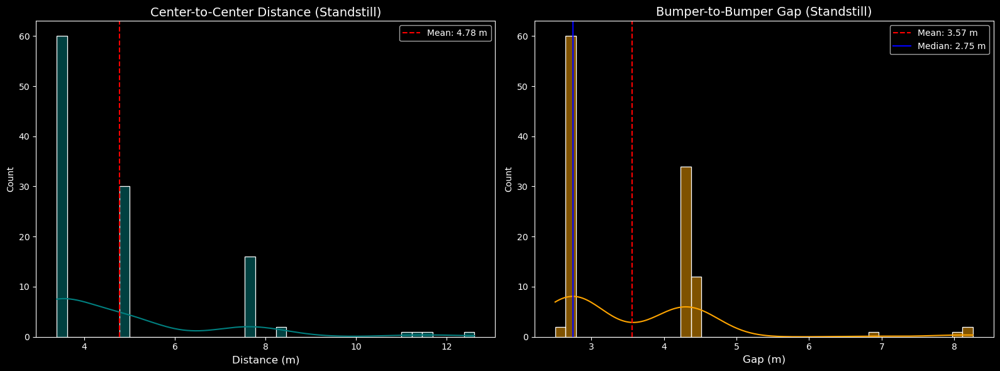

In [48]:
def load_and_adapt_simulation_data(sim_csv_path):
    """
    Loads simulation CSV and adapts it to match the format of the DRIFT dataset 
    expected by the analysis functions.
    
    Parameters:
    - sim_csv_path: Path to the simulation output CSV.
    
    Returns:
    - List containing a single DataFrame (as 'sessions' usually expects a list).
    """
    
    print(f"Loading simulation data from {sim_csv_path}...")
    df = pd.read_csv(sim_csv_path)
    
    # 1. Convert Timestamp (Float Seconds -> HH:MM:SS.mmm string or datetime)
    # Analysis functions usually parse 'timestamp' column string to datetime.
    # To be compatible, we'll create a dummy base time and add the float seconds.
    base_time = pd.Timestamp('2024-01-01 08:00:00')
    
    # Check if timestamp is seconds (float)
    if pd.api.types.is_numeric_dtype(df['timestamp']):
        # Create a datetime column directly
        # We need to format it back to string if the functions strictly parse string,
        # BUT the analysis functions above usually do: pd.to_datetime(df['timestamp'], format=...)
        # To make it robust, let's just create a formatted string column.
        
        datetimes = base_time + pd.to_timedelta(df['timestamp'], unit='s')
        df['timestamp'] = datetimes.dt.strftime('%H:%M:%S.%f').str[:-3] # Truncate micros to millis
        
    # 2. Ensure Geometry Columns (Width, Height, Angle)
    # Simulation data has corners: (x1,y1) ... (x4,y4)
    # We can calculate width/height/angle from these if they exist.
    if 'x1' in df.columns and 'x2' in df.columns and 'y1' in df.columns and 'y2' in df.columns:
        # Assuming x1,y1 is front-left? or rear-left? 
        # Usually corners are ordered. Let's assume adjacent points define edges.
        # Edge 1: (x1,y1) to (x2,y2) -> usually width or length
        # Edge 2: (x2,y2) to (x3,y3) -> the other dimension
        
        dx1 = df['x2'] - df['x1']
        dy1 = df['y2'] - df['y1']
        len1 = np.sqrt(dx1**2 + dy1**2)
        
        dx2 = df['x3'] - df['x2']
        dy2 = df['y3'] - df['y2']
        len2 = np.sqrt(dx2**2 + dy2**2)
        
        # Heuristic: Longer side is length (height in drift), shorter is width
        # But wait, in the drift snippet: width ~53, height ~20. 
        # So 'width' is actually the length of the car (long side) in that specific dataset snippet?
        # Let's check the values:
        # Drift: width=53, height=20. Normal car is ~4.5m long, 1.8m wide. Ratio ~2.5.
        # 53/20 = 2.65. Matches. 
        # So in DRIFT, 'width' is the LONG dimension (Length), 'height' is the SHORT dimension (Width of car body).
        
        df['dim_a'] = len1
        df['dim_b'] = len2
        
        # Assign length to 'width' and car-width to 'height' to match DRIFT conventions
        df['width'] = df[['dim_a', 'dim_b']].max(axis=1)  # Length of car
        df['height'] = df[['dim_a', 'dim_b']].min(axis=1) # Width of car body
        
        # Calculate Angle
        # Angle of the long side.
        # We need to know which edge is the long one.
        # If len1 > len2: vector is (dx1, dy1)
        # If len2 > len1: vector is (dx2, dy2)
        
        # Vectorized calculation
        df['angle'] = 0.0
        mask_1_long = df['dim_a'] >= df['dim_b']
        
        # Calculate angle for edge 1
        df.loc[mask_1_long, 'angle'] = np.arctan2(dy1[mask_1_long], dx1[mask_1_long])
        
        # Calculate angle for edge 2
        df.loc[~mask_1_long, 'angle'] = np.arctan2(dy2[~mask_1_long], dx2[~mask_1_long])
        
    else:
        # Fallback if corners missing: Constant size
        print("Warning: Corner columns missing. Using default car size.")
        df['width'] = 40.0 # px approx for ~4.5m
        df['height'] = 18.0 # px approx
        df['angle'] = 0.0 # Cannot infer heading easily without velocity history here
    
    # 3. Ensure essential columns exist
    required_cols = ['track_id', 'center_x', 'center_y']
    for col in required_cols:
        if col not in df.columns:
            raise ValueError(f"Missing required column '{col}' in simulation data.")

    print(f"Adapted data: {len(df)} rows.")
    return [df] # Return as list for compatibility

# Example Usage:
sim_path = '../data/drift/simulation.csv'
sim_sessions = load_and_adapt_simulation_data(sim_path)

# Now run analysis
analyze_standstill_distances(sim_sessions)

Loading simulation data from ../data/drift/simulation.csv...
Adapted data: 5246 rows.
Simulation data loaded successfully.

--- 1. Entering Traffic Stats ---
Processing 1 sessions...
AGGREGATED TRAFFIC STATS (Total Duration: 29.90s)
Lane       | Side       | Total Count  | Freq (cars/s)  
------------------------------------------------------------
Lane 1     | Left       | 6            | 0.2007
Lane 2     | Left       | 1            | 0.0334
Not enough data for Top to find 3 lanes.
Lane 6     | Right      | 2            | 0.0669
Lane 7     | Right      | 2            | 0.0669
Lane 8     | Right      | 2            | 0.0669


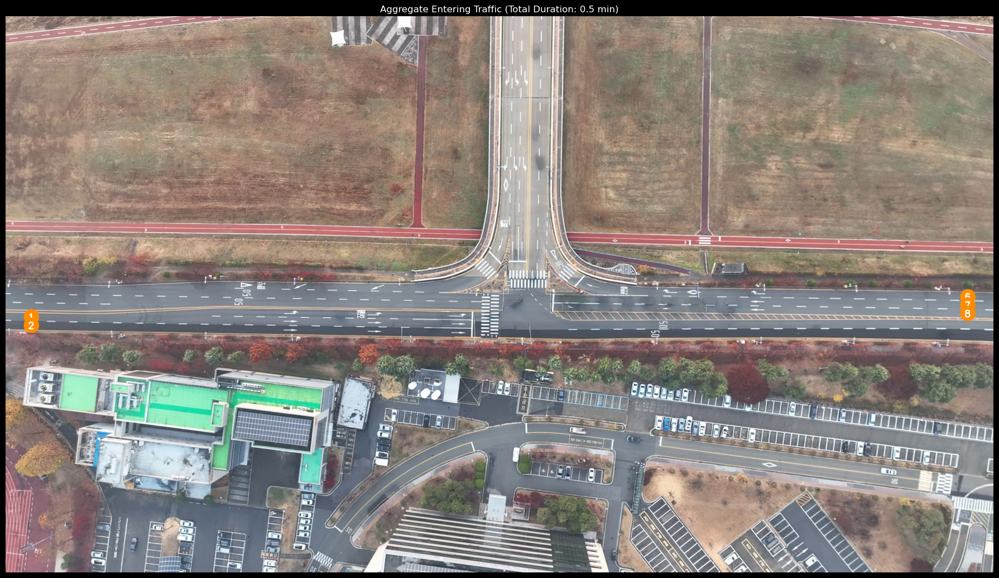


--- 2. Speed Heatmap ---
Calculating speeds across sessions...
Computed speeds for 5223 points. Avg Speed: 5.59 m/s


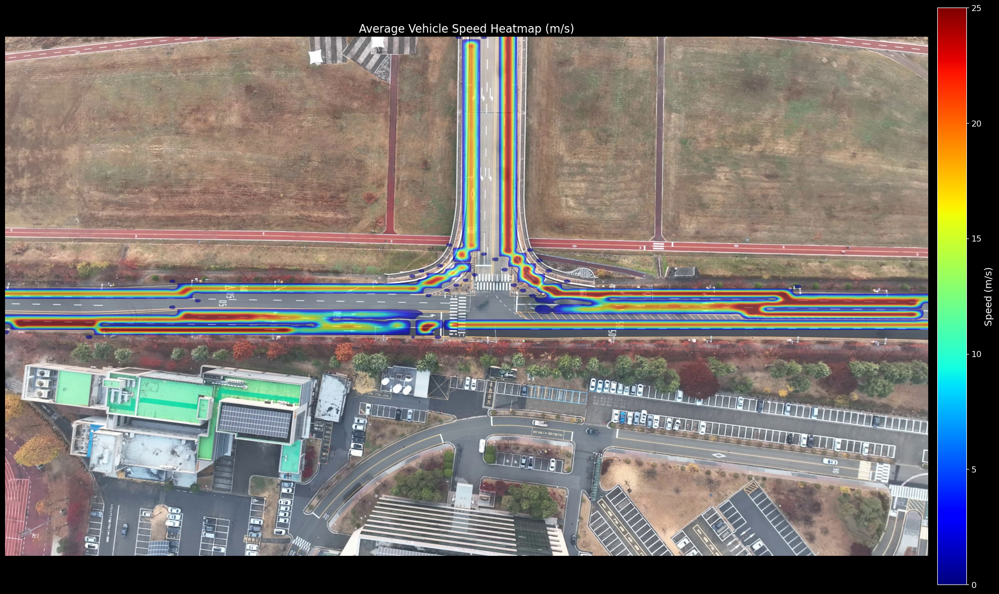


--- 3. Deceleration Analysis (Braking) ---
Analyzing continuous deceleration phases...
Analyzed 100 data points of braking.
Average Deceleration: 3.44 m/s²
Median Deceleration: 3.38 m/s²
95th Percentile (Hard Braking): 5.73 m/s²


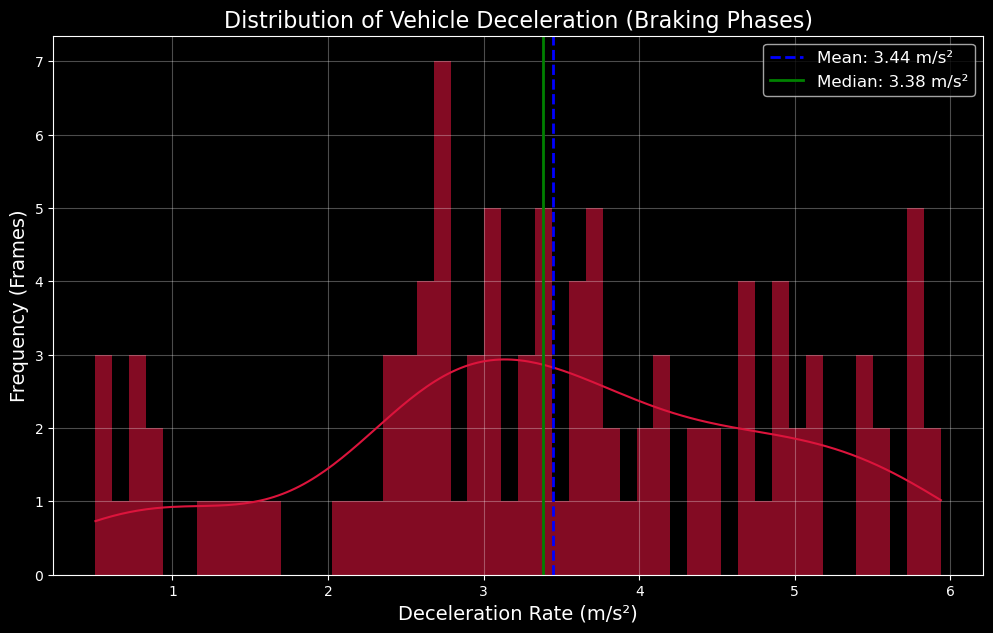


--- 4. Acceleration Analysis (Speeding Up) ---
Analyzing continuous acceleration phases...
Analyzed 14 data points of acceleration.
Average Acceleration: 0.62 m/s²
Median Acceleration: 0.59 m/s²
95th Percentile: 0.76 m/s²


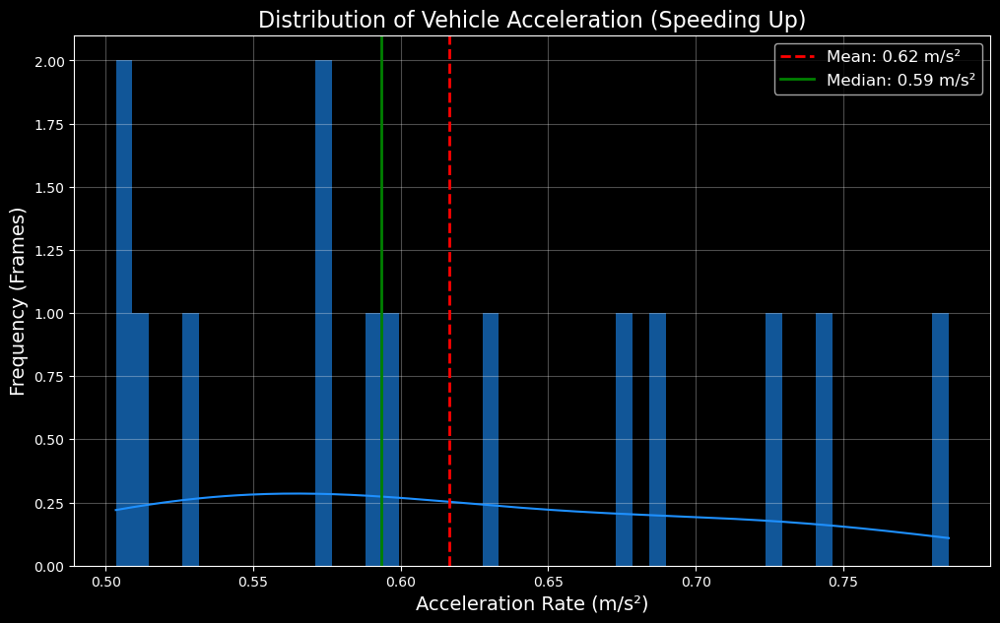


--- 5. Standstill Distances (Gap/Headway) ---
Analyzing standstill distances...
Analyzed 112 stopped pairs.
Avg Center-to-Center: 4.78 m (Median: 3.39 m)
Avg Bumper-to-Bumper: 3.57 m (Median: 2.75 m)


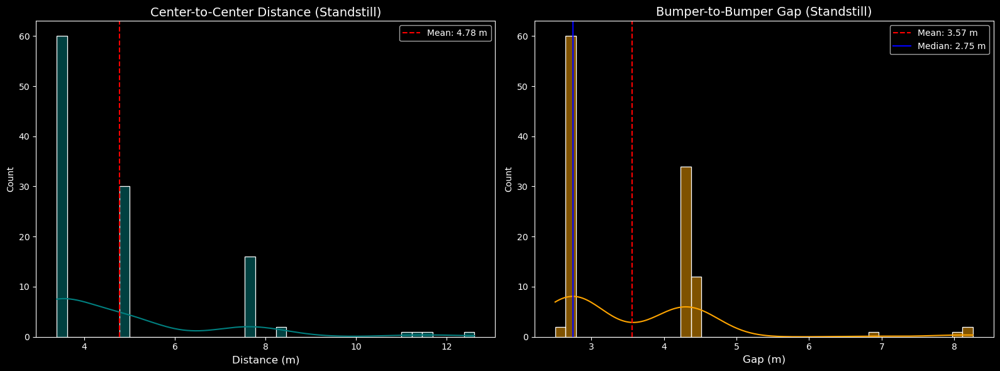

In [49]:
# 1. Load and Adapt Simulation Data
sim_path = '../data/drift/simulation.csv' # Path to your sim file
# img_path = '../eda/data/media/SiteA.jpg' # Already defined in your notebook

try:
    sim_sessions = load_and_adapt_simulation_data(sim_path)
    print("Simulation data loaded successfully.")
except Exception as e:
    print(f"Error loading simulation data: {e}")
    sim_sessions = []

if sim_sessions:
    print("\n--- 1. Entering Traffic Stats ---")
    try:
        visualize_entering_stats_multi(sim_sessions, img_path)
    except Exception as e:
        print(f"Error in entering stats: {e}")

    print("\n--- 2. Speed Heatmap ---")
    try:
        visualize_speed_heatmap(sim_sessions, img_path)
    except Exception as e:
        print(f"Error in speed heatmap: {e}")

    print("\n--- 3. Deceleration Analysis (Braking) ---")
    try:
        analyze_stopping_deceleration_v2(sim_sessions)
    except Exception as e:
        print(f"Error in deceleration analysis: {e}")

    print("\n--- 4. Acceleration Analysis (Speeding Up) ---")
    try:
        analyze_acceleration_phases(sim_sessions)
    except Exception as e:
        print(f"Error in acceleration analysis: {e}")

    print("\n--- 5. Standstill Distances (Gap/Headway) ---")
    try:
        analyze_standstill_distances(sim_sessions)
    except Exception as e:
        print(f"Error in standstill analysis: {e}")